In [89]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_absolute_error,mean_pinball_loss,mean_squared_error,r2_score

In [2]:
df = pd.read_csv('/Users/aadityajoshi/Downloads/archive-16/apartments_for_rent_classified_100K/apartments_for_rent_classified_100K.csv',sep=";",encoding='cp1252')

In [3]:
df.head()

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
0,5668640009,housing/rent/apartment,One BR 507 & 509 Esplanade,"This unit is located at 507 & 509 Esplanade, R...",NaN,1.0,1.0,USD,No,Thumbnail,...,"$2,195",Monthly,542,507 509 Esplanade,Redondo Beach,CA,33.8520,-118.3759,RentLingo,1577360355
1,5668639818,housing/rent/apartment,Three BR 146 Lochview Drive,"This unit is located at 146 Lochview Drive, Ne...",NaN,1.5,3.0,USD,No,Thumbnail,...,"$1,250",Monthly,1500,146 Lochview Dr,Newport News,VA,37.0867,-76.4941,RentLingo,1577360340
2,5668639686,housing/rent/apartment,Three BR 3101 Morningside Drive,This unit is located at 3101 Morningside Drive...,NaN,2.0,3.0,USD,No,Thumbnail,...,"$1,395",Monthly,1650,3101 Morningside Dr,Raleigh,NC,35.8230,-78.6438,RentLingo,1577360332
3,5668639659,housing/rent/apartment,Two BR 209 Aegean Way,"This unit is located at 209 Aegean Way, Vacavi...",NaN,1.0,2.0,USD,No,Thumbnail,...,"$1,600",Monthly,820,209 Aegean Way,Vacaville,CA,38.3622,-121.9712,RentLingo,1577360330
4,5668639374,housing/rent/apartment,One BR 4805 Marquette NE,"This unit is located at 4805 Marquette NE, Alb...",NaN,1.0,1.0,USD,No,Thumbnail,...,$975,Monthly,624,4805 Marquette NE,Albuquerque,NM,35.1038,-106.6110,RentLingo,1577360308


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             99492 non-null  int64  
 1   category       99492 non-null  object 
 2   title          99492 non-null  object 
 3   body           99492 non-null  object 
 4   amenities      83448 non-null  object 
 5   bathrooms      99429 non-null  float64
 6   bedrooms       99368 non-null  float64
 7   currency       99492 non-null  object 
 8   fee            99492 non-null  object 
 9   has_photo      99492 non-null  object 
 10  pets_allowed   39068 non-null  object 
 11  price          99491 non-null  float64
 12  price_display  99491 non-null  object 
 13  price_type     99492 non-null  object 
 14  square_feet    99492 non-null  int64  
 15  address        7943 non-null   object 
 16  cityname       99190 non-null  object 
 17  state          99190 non-null  object 
 18  latitu

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,99492.0,5.358321e+09,1.847404e+08,5.121046e+09,5.197950e+09,5.508673e+09,5.509007e+09,5.669439e+09
bathrooms,99429.0,1.445323e+00,5.470206e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,9.000000e+00
bedrooms,99368.0,1.728212e+00,7.492005e-01,0.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,9.000000e+00
price,99491.0,1.527057e+03,9.042459e+02,1.000000e+02,1.013000e+03,1.350000e+03,1.795000e+03,5.250000e+04
square_feet,99492.0,9.564307e+02,4.175715e+02,1.010000e+02,7.290000e+02,9.000000e+02,1.115000e+03,5.000000e+04
latitude,99467.0,3.694799e+01,4.599461e+00,1.957380e+01,3.374650e+01,3.722820e+01,3.995300e+01,6.483320e+01
longitude,99467.0,-9.156866e+01,1.581717e+01,-1.593698e+02,-1.047919e+02,-8.456230e+01,-7.760820e+01,-6.877880e+01
time,99492.0,1.559665e+09,1.105077e+07,1.544174e+09,1.550832e+09,1.568745e+09,1.568767e+09,1.577391e+09


In [6]:
from ydata_profiling import ProfileReport
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.drop(['id','category','currency','fee'],axis=1,inplace=True)

In [8]:
%matplotlib inline
df['price'].describe()

count    99491.000000
mean      1527.057281
std        904.245882
min        100.000000
25%       1013.000000
50%       1350.000000
75%       1795.000000
max      52500.000000
Name: price, dtype: float64

In [9]:
#change price of weekly to monthly
df['price'] = df.apply(lambda x: 4 * x['price'] if x['price_type'] == 'Weekly' else x['price'], axis=1)

In [10]:
df.drop('price_type',axis=1,inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   title          99492 non-null  object 
 1   body           99492 non-null  object 
 2   amenities      83448 non-null  object 
 3   bathrooms      99429 non-null  float64
 4   bedrooms       99368 non-null  float64
 5   has_photo      99492 non-null  object 
 6   pets_allowed   39068 non-null  object 
 7   price          99491 non-null  float64
 8   price_display  99491 non-null  object 
 9   square_feet    99492 non-null  int64  
 10  address        7943 non-null   object 
 11  cityname       99190 non-null  object 
 12  state          99190 non-null  object 
 13  latitude       99467 non-null  float64
 14  longitude      99467 non-null  float64
 15  source         99492 non-null  object 
 16  time           99492 non-null  int64  
dtypes: float64(5), int64(2), object(10)
memory usage: 

In [12]:
df.isnull().sum().sort_values(ascending=False)/len(df)

address          0.920164
pets_allowed     0.607325
amenities        0.161259
state            0.003035
cityname         0.003035
bedrooms         0.001246
bathrooms        0.000633
longitude        0.000251
latitude         0.000251
price_display    0.000010
price            0.000010
source           0.000000
title            0.000000
square_feet      0.000000
body             0.000000
has_photo        0.000000
time             0.000000
dtype: float64

In [13]:
#we can not impute values if its missing more than 10%
df.drop(['address','pets_allowed','amenities'],axis=1,inplace=True)

In [14]:
df.dropna(inplace=True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99007 entries, 0 to 99491
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   title          99007 non-null  object 
 1   body           99007 non-null  object 
 2   bathrooms      99007 non-null  float64
 3   bedrooms       99007 non-null  float64
 4   has_photo      99007 non-null  object 
 5   price          99007 non-null  float64
 6   price_display  99007 non-null  object 
 7   square_feet    99007 non-null  int64  
 8   cityname       99007 non-null  object 
 9   state          99007 non-null  object 
 10  latitude       99007 non-null  float64
 11  longitude      99007 non-null  float64
 12  source         99007 non-null  object 
 13  time           99007 non-null  int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 11.3+ MB


In [16]:
df['title'].head()

0         One BR 507 & 509 Esplanade
1        Three BR 146 Lochview Drive
2    Three BR 3101 Morningside Drive
3              Two BR 209 Aegean Way
4           One BR 4805 Marquette NE
Name: title, dtype: object

In [17]:
df['body'].head()

0    This unit is located at 507 & 509 Esplanade, R...
1    This unit is located at 146 Lochview Drive, Ne...
2    This unit is located at 3101 Morningside Drive...
3    This unit is located at 209 Aegean Way, Vacavi...
4    This unit is located at 4805 Marquette NE, Alb...
Name: body, dtype: object

In [18]:
df.drop(['title','body','time'],axis=1,inplace=True)

In [19]:
df.drop('price_display',axis=1,inplace=True)

In [20]:
df.head()

,bathrooms,bedrooms,has_photo,price,square_feet,cityname,state,latitude,longitude,source
0,1.0,1.0,Thumbnail,2195.0,542,Redondo Beach,CA,33.8520,-118.3759,RentLingo
1,1.5,3.0,Thumbnail,1250.0,1500,Newport News,VA,37.0867,-76.4941,RentLingo
2,2.0,3.0,Thumbnail,1395.0,1650,Raleigh,NC,35.8230,-78.6438,RentLingo
3,1.0,2.0,Thumbnail,1600.0,820,Vacaville,CA,38.3622,-121.9712,RentLingo
4,1.0,1.0,Thumbnail,975.0,624,Albuquerque,NM,35.1038,-106.6110,RentLingo


In [21]:
df

,bathrooms,bedrooms,has_photo,price,square_feet,cityname,state,latitude,longitude,source
0,1.0,1.0,Thumbnail,2195.0,542,Redondo Beach,CA,33.8520,-118.3759,RentLingo
1,1.5,3.0,Thumbnail,1250.0,1500,Newport News,VA,37.0867,-76.4941,RentLingo
2,2.0,3.0,Thumbnail,1395.0,1650,Raleigh,NC,35.8230,-78.6438,RentLingo
3,1.0,2.0,Thumbnail,1600.0,820,Vacaville,CA,38.3622,-121.9712,RentLingo
4,1.0,1.0,Thumbnail,975.0,624,Albuquerque,NM,35.1038,-106.6110,RentLingo
...,...,...,...,...,...,...,...,...,...,...
99487,1.0,1.0,Yes,780.0,605,Houston,TX,29.6151,-95.1998,RentDigs.com
99488,2.0,2.0,Yes,813.0,921,Jacksonville,FL,30.2254,-81.7579,RentDigs.com
99489,1.0,1.0,Yes,1325.0,650,San Diego,CA,32.7379,-117.0914,RentDigs.com
99490,1.0,1.0,Yes,931.0,701,Huntersville,NC,35.4158,-80.8451,RentDigs.com


In [24]:
num_cols = ['bathrooms', 'bedrooms','square_feet','latitude', 'longitude']
cat_cols = ['has_photo','cityname', 'state','source']
target_col = ['price']

In [31]:
def plot_box(df):
    numerical_cols = ['bathrooms', 'bedrooms','square_feet','latitude', 'longitude',]
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(15,20),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.boxplot(y=column,data=df,palette='rocket', linewidth=2.5, saturation=0.9,ax=ax,width=0.55)
        ax.set_title(f'Boxplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

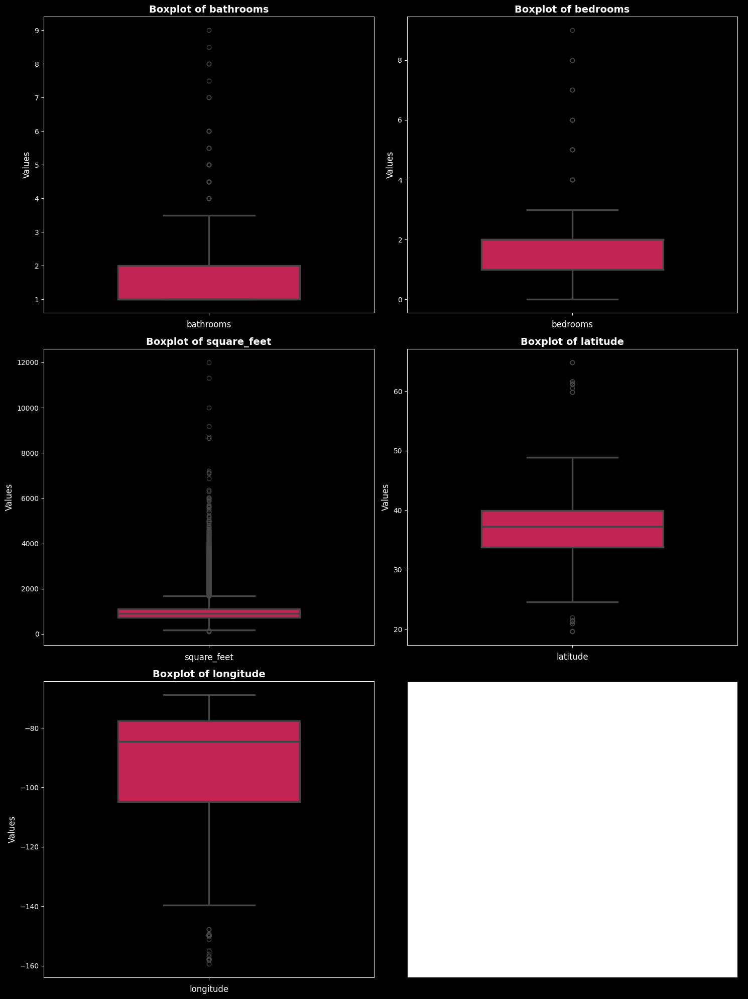

In [32]:
plot_box(df)

In [35]:
def plot_hist(df):
    numerical_cols = ['bathrooms', 'bedrooms','square_feet','latitude', 'longitude',]
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(15,20),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.histplot(x=column,data=df,palette='rocket',ax=ax,bins=50,kde=True)
        ax.set_title(f'Histlot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

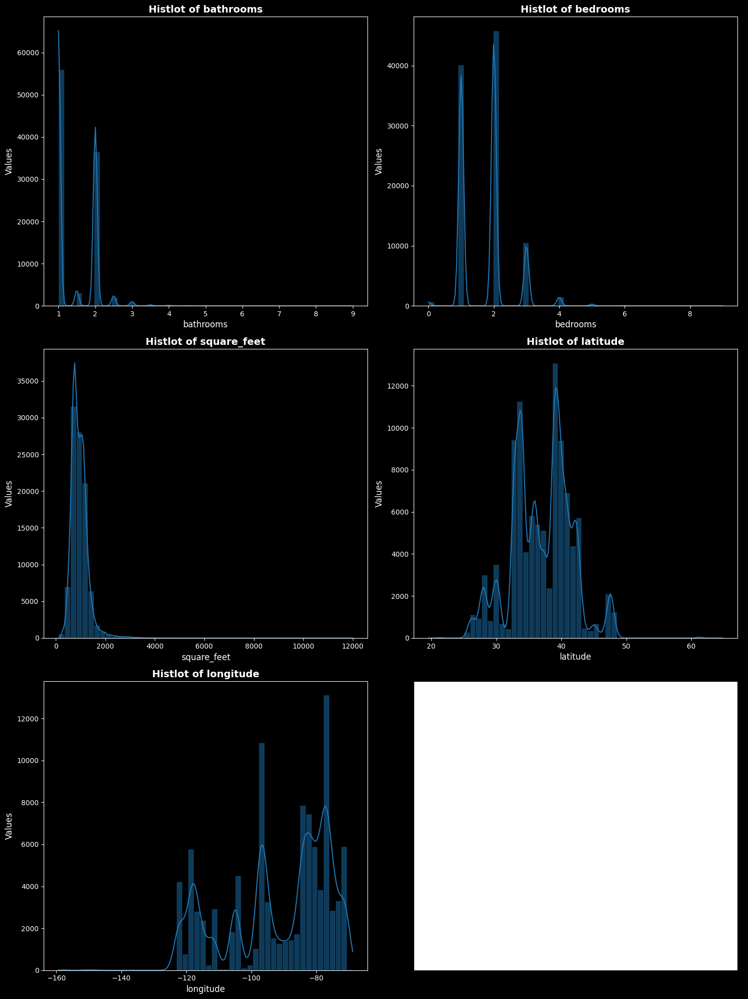

In [36]:
plot_hist(df)

In [51]:
def plot_scatter(df):
    numerical_cols = ['bathrooms', 'bedrooms','square_feet','latitude', 'longitude']
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(15,20),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.scatterplot(y=df['price'],x=df[column],ax=ax)
        ax.set_title(f'Scatterplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

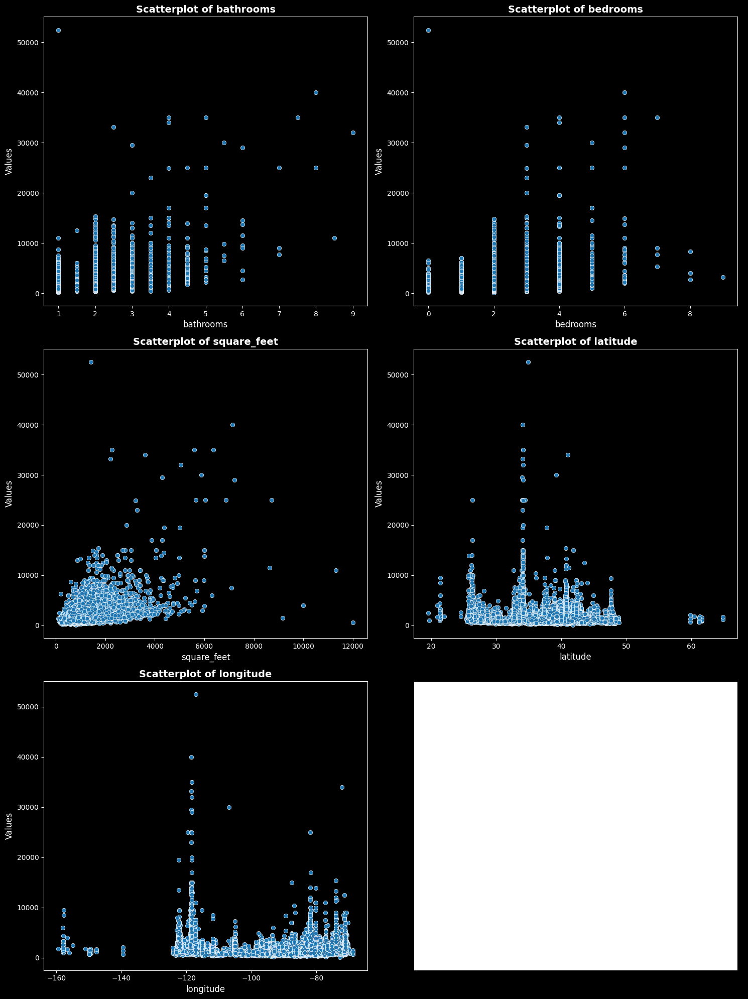

In [52]:
plot_scatter(df)

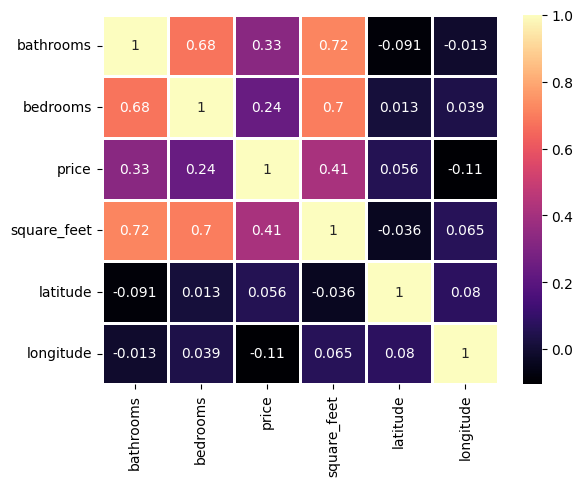

In [56]:
sns.heatmap(df.select_dtypes(include='number').corr(),cmap='magma',linecolor='white',annot=True,linewidths=1)
plt.show()

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99007 entries, 0 to 99491
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   bathrooms    99007 non-null  float64
 1   bedrooms     99007 non-null  float64
 2   has_photo    99007 non-null  object 
 3   price        99007 non-null  float64
 4   square_feet  99007 non-null  int64  
 5   cityname     99007 non-null  object 
 6   state        99007 non-null  object 
 7   latitude     99007 non-null  float64
 8   longitude    99007 non-null  float64
 9   source       99007 non-null  object 
dtypes: float64(5), int64(1), object(4)
memory usage: 8.3+ MB


In [60]:
from sklearn.preprocessing import LabelEncoder
lbl_en = LabelEncoder()
for col in cat_cols:
    df[col] = lbl_en.fit_transform(df[col])

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99007 entries, 0 to 99491
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   bathrooms    99007 non-null  float64
 1   bedrooms     99007 non-null  float64
 2   has_photo    99007 non-null  int64  
 3   price        99007 non-null  float64
 4   square_feet  99007 non-null  int64  
 5   cityname     99007 non-null  int64  
 6   state        99007 non-null  int64  
 7   latitude     99007 non-null  float64
 8   longitude    99007 non-null  float64
 9   source       99007 non-null  int64  
dtypes: float64(5), int64(5)
memory usage: 8.3 MB


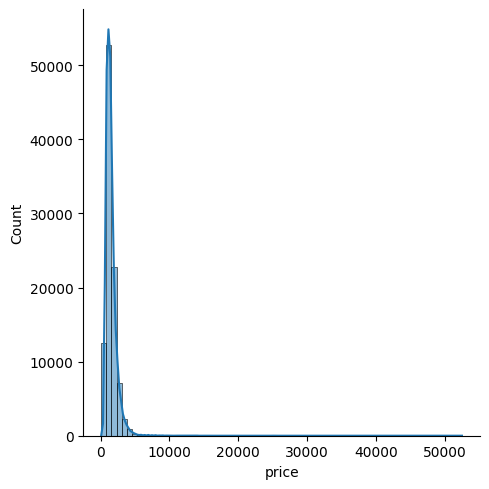

In [64]:
sns.displot(x='price',data=df,kde=True,bins=70)
plt.show()

In [249]:
df['price'].sort_values(ascending=False).head(10)

23574    24992.0
70045    24992.0
3487     24992.0
41199    24992.0
83845    24896.0
23888    23008.0
18325    20000.0
95244    19504.0
6574     19504.0
68438    16992.0
Name: price, dtype: float64

In [245]:
df.drop(top_high_price,inplace=True)

In [246]:
df[df['price'] == df['price'].max()]

,bathrooms,bedrooms,has_photo,price,square_feet,cityname,state,latitude,longitude,source
3487,8,6,1,24992.0,8716,1715,4,34.437500,-119.6250,18
23574,5,4,1,24992.0,6881,2096,4,34.000000,-118.4375,16
41199,7,5,2,24992.0,6035,1490,4,34.093750,-118.5000,16
70045,4,4,2,24992.0,5663,258,9,26.359375,-81.8125,16


In [73]:
#this was an analmoly in my opinion
df.drop(6863,inplace=True)

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99006 entries, 0 to 99491
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   bathrooms    99006 non-null  float64
 1   bedrooms     99006 non-null  float64
 2   has_photo    99006 non-null  int64  
 3   price        99006 non-null  float64
 4   square_feet  99006 non-null  int64  
 5   cityname     99006 non-null  int64  
 6   state        99006 non-null  int64  
 7   latitude     99006 non-null  float64
 8   longitude    99006 non-null  float64
 9   source       99006 non-null  int64  
dtypes: float64(5), int64(5)
memory usage: 8.3 MB


In [81]:
int8_cls = ['bathrooms','bedrooms','has_photo','state','source']
for col in int8_cls:
    df[col] = df[col].astype('int8')

In [78]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
bathrooms,99006.0,1.445897,0.547159,1.0000,1.0000,1.0000,2.0000,9.0000
bedrooms,99006.0,1.728713,0.748680,0.0000,1.0000,2.0000,2.0000,9.0000
has_photo,99006.0,1.470416,0.659236,0.0000,1.0000,2.0000,2.0000,2.0000
price,99006.0,1525.461921,890.112133,100.0000,1014.0000,1350.0000,1795.0000,40000.0000
square_feet,99006.0,956.067986,365.386840,107.0000,730.0000,900.0000,1115.0000,12000.0000
cityname,99006.0,1345.933953,836.244190,0.0000,624.0000,1349.0000,2084.0000,2976.0000
state,99006.0,24.423681,15.211742,0.0000,9.0000,27.0000,40.0000,50.0000
latitude,99006.0,36.941634,4.603590,19.5738,33.7435,37.2139,39.9559,64.8332
longitude,99006.0,-91.543916,15.825367,-159.3698,-104.8171,-84.5465,-77.5767,-68.7788
source,99006.0,16.036563,1.179028,0.0000,16.0000,16.0000,16.0000,24.0000


In [99]:
#reduces
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99006 entries, 0 to 99491
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   bathrooms    99006 non-null  int8   
 1   bedrooms     99006 non-null  int8   
 2   has_photo    99006 non-null  int8   
 3   price        99006 non-null  float64
 4   square_feet  99006 non-null  int16  
 5   cityname     99006 non-null  int16  
 6   state        99006 non-null  int8   
 7   latitude     99006 non-null  float16
 8   longitude    99006 non-null  float16
 9   source       99006 non-null  int8   
dtypes: float16(2), float64(1), int16(2), int8(5)
memory usage: 2.7 MB


In [87]:
#split and normalize
X = df.drop('price',axis=1)
y = df['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.15)

In [88]:
sclr = MinMaxScaler()
X_train = sclr.fit_transform(X_train)
X_test = sclr.transform(X_test)

In [115]:
metrics_dict = {}

In [132]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_dtree)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_dtree))}")
print(f"R2 Score : {r2_score(y_test,pred_dtree)}")
metrics_dict["DTREE"] = [mean_absolute_error(y_test,pred_dtree),np.sqrt(mean_squared_error(y_test,pred_dtree))]

mean absolute error : 221.0987368737708
root mean squared error : 509.0492832602682
R2 Score : 0.6156197548128799


In [133]:
df['price'].describe()

count    99006.000000
mean      1525.473436
std        890.122888
min        100.000000
25%       1014.000000
50%       1350.000000
75%       1795.000000
max      40000.000000
Name: price, dtype: float64

### Lasso Regression and variants

In [136]:
from sklearn.linear_model import Lasso
lasso = Lasso()
lasso.fit(X_train,y_train)
pred_lasso = lasso.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_lasso)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_lasso))}")
print(f"R2 Score : {r2_score(y_test,pred_lasso)}")
metrics_dict["Lasso"] = [mean_absolute_error(y_test,pred_lasso),np.sqrt(mean_squared_error(y_test,pred_lasso))]

mean absolute error : 480.2596740722656
root mean squared error : 726.8807373046875
R2 Score : 0.21626776456832886


In [137]:
from sklearn.linear_model import LassoCV
lassocv = LassoCV()
lassocv.fit(X_train,y_train)
pred_lassocv = lassocv.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_lassocv)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_lassocv))}")
print(f"R2 Score : {r2_score(y_test,pred_lassocv)}")
metrics_dict["LassoCV"] = [mean_absolute_error(y_test,pred_lassocv),np.sqrt(mean_squared_error(y_test,pred_lassocv))]

mean absolute error : 483.4790954589844
root mean squared error : 729.8800659179688
R2 Score : 0.20978641510009766


In [138]:
from sklearn.linear_model import LassoLars
lassolr = LassoLars()
lassolr.fit(X_train,y_train)
pred_lassolr = lassolr.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_lassolr)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_lassolr))}")
print(f"R2 Score : {r2_score(y_test,pred_lassolr)}")
metrics_dict["LassoLars"] = [mean_absolute_error(y_test,pred_lassolr),np.sqrt(mean_squared_error(y_test,pred_lassolr))]

mean absolute error : 480.25994873046875
root mean squared error : 726.880859375
R2 Score : 0.2162674069404602


### Ridge

In [139]:
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(X_train,y_train)
pred_ridge = ridge.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_ridge)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_ridge))}")
print(f"R2 Score : {r2_score(y_test,pred_ridge)}")
metrics_dict["Ridge"] = [mean_absolute_error(y_test,pred_ridge),np.sqrt(mean_squared_error(y_test,pred_ridge))]

mean absolute error : 483.2087097167969
root mean squared error : 729.4229125976562
R2 Score : 0.2107759714126587


In [140]:
from sklearn.linear_model import RidgeCV
ridgecv = RidgeCV()
ridgecv.fit(X_train,y_train)
pred_ridgecv = ridgecv.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_ridgecv)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_ridgecv))}")
print(f"R2 Score : {r2_score(y_test,pred_ridgecv)}")
metrics_dict["RidgeCV"] = [mean_absolute_error(y_test,pred_ridgecv),np.sqrt(mean_squared_error(y_test,pred_ridgecv))]

mean absolute error : 483.6746294845883
root mean squared error : 730.0617920921183
R2 Score : 0.20939302922635505


### ElasticNet

In [141]:
from sklearn.linear_model import ElasticNet
e_net = ElasticNet()
e_net.fit(X_train,y_train)
pred_enet = e_net.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_enet)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_enet))}")
print(f"R2 Score : {r2_score(y_test,pred_enet)}")
metrics_dict["ElasticNet"] = [mean_absolute_error(y_test,pred_enet),np.sqrt(mean_squared_error(y_test,pred_enet))]

mean absolute error : 529.8396606445312
root mean squared error : 813.4380493164062
R2 Score : 0.01849973201751709


In [146]:
metrics_df = pd.DataFrame(metrics_dict,index=['MAE','RMSE'])

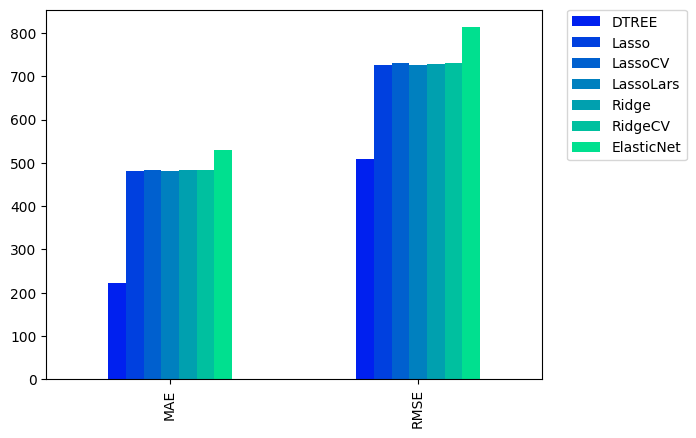

In [164]:
#dtree gives best results so far
colors = sns.color_palette("winter", len(metrics_df.columns))
metrics_df.plot(kind='bar', color=colors)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

### RFC

In [181]:
from sklearn.ensemble import RandomForestRegressor
rfc = RandomForestRegressor()
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_rfc)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_rfc))}")
print(f"R2 Score : {r2_score(y_test,pred_rfc)}")
metrics_dict["RFC"] = [mean_absolute_error(y_test,pred_rfc),np.sqrt(mean_squared_error(y_test,pred_rfc))]

mean absolute error : 183.9565563977187
root mean squared error : 419.5347750276425
R2 Score : 0.7674236622216977


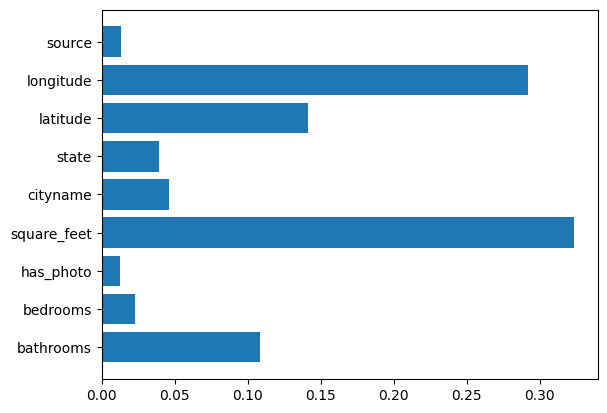

In [170]:
#feature importance
plt.barh(list(df.drop('price',axis=1).columns),list(rfc.feature_importances_))
plt.show()

### SVM

In [182]:
from sklearn.svm import SVR
svm = SVR()
svm.fit(X_train,y_train)
pred_svm = svm.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_svm)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_svm))}")
print(f"R2 Score : {r2_score(y_test,pred_svm)}")
metrics_dict["SVR"] = [mean_absolute_error(y_test,pred_svm),np.sqrt(mean_squared_error(y_test,pred_svm))]

mean absolute error : 486.4011568606108
root mean squared error : 845.3809509009417
R2 Score : 0.05564667748177532


## Tree based models are performing better, and have better explainability in this case

### Catboost

In [250]:
X = df.drop('price',axis=1)
y = df['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.15)

In [180]:
#baseline model
from catboost import CatBoostRegressor
cat_rg = CatBoostRegressor()
cat_rg.fit(X_train,y_train,
          eval_set=(X_val,y_val),
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.095902
0:	learn: 847.5606355	test: 944.6672713	best: 944.6672713 (0)	total: 63ms	remaining: 1m 2s
1:	learn: 816.5646731	test: 915.1603737	best: 915.1603737 (1)	total: 64.9ms	remaining: 32.4s
2:	learn: 787.3118305	test: 885.4054427	best: 885.4054427 (2)	total: 66.7ms	remaining: 22.2s
3:	learn: 762.5041963	test: 860.8635555	best: 860.8635555 (3)	total: 68.3ms	remaining: 17s
4:	learn: 740.6197797	test: 837.8643269	best: 837.8643269 (4)	total: 70.7ms	remaining: 14.1s
5:	learn: 721.0150987	test: 818.4386199	best: 818.4386199 (5)	total: 72.5ms	remaining: 12s
6:	learn: 703.0948317	test: 798.8665318	best: 798.8665318 (6)	total: 74.6ms	remaining: 10.6s
7:	learn: 687.2988155	test: 780.6600536	best: 780.6600536 (7)	total: 76.5ms	remaining: 9.49s
8:	learn: 673.3587586	test: 765.0010539	best: 765.0010539 (8)	total: 78.7ms	remaining: 8.66s
9:	learn: 660.5259652	test: 749.6386768	best: 749.6386768 (9)	total: 80.6ms	remaining: 7.98s
10:	learn: 649.0564738	test: 736.0151845	best:

168:	learn: 433.0535196	test: 540.5711556	best: 540.5711556 (168)	total: 390ms	remaining: 1.92s
169:	learn: 432.5552042	test: 540.5112950	best: 540.5112950 (169)	total: 392ms	remaining: 1.91s
170:	learn: 432.1778986	test: 540.2077386	best: 540.2077386 (170)	total: 394ms	remaining: 1.91s
171:	learn: 432.0435012	test: 540.0205638	best: 540.0205638 (171)	total: 396ms	remaining: 1.9s
172:	learn: 431.5022529	test: 539.7213876	best: 539.7213876 (172)	total: 398ms	remaining: 1.9s
173:	learn: 431.0529847	test: 539.2061005	best: 539.2061005 (173)	total: 400ms	remaining: 1.9s
174:	learn: 430.7793599	test: 538.9510361	best: 538.9510361 (174)	total: 402ms	remaining: 1.89s
175:	learn: 430.1592429	test: 538.3387105	best: 538.3387105 (175)	total: 404ms	remaining: 1.89s
176:	learn: 429.8847013	test: 538.1467184	best: 538.1467184 (176)	total: 406ms	remaining: 1.89s
177:	learn: 429.4527703	test: 537.8941283	best: 537.8941283 (177)	total: 409ms	remaining: 1.89s
178:	learn: 429.2287750	test: 537.7546838	b

274:	learn: 402.0059861	test: 523.2148824	best: 523.2148824 (274)	total: 588ms	remaining: 1.55s
275:	learn: 401.7085553	test: 523.0467830	best: 523.0467830 (275)	total: 590ms	remaining: 1.55s
276:	learn: 401.5933337	test: 522.9338282	best: 522.9338282 (276)	total: 592ms	remaining: 1.54s
277:	learn: 401.5014466	test: 522.8385936	best: 522.8385936 (277)	total: 594ms	remaining: 1.54s
278:	learn: 401.3619519	test: 522.7906813	best: 522.7906813 (278)	total: 596ms	remaining: 1.54s
279:	learn: 401.1925370	test: 522.7061978	best: 522.7061978 (279)	total: 598ms	remaining: 1.54s
280:	learn: 401.1102751	test: 522.5795124	best: 522.5795124 (280)	total: 600ms	remaining: 1.53s
281:	learn: 400.8806502	test: 522.3288833	best: 522.3288833 (281)	total: 602ms	remaining: 1.53s
282:	learn: 400.6994882	test: 522.4171686	best: 522.3288833 (281)	total: 604ms	remaining: 1.53s
283:	learn: 400.4656447	test: 522.3587062	best: 522.3288833 (281)	total: 606ms	remaining: 1.53s
284:	learn: 400.2823672	test: 522.225276

380:	learn: 384.1449522	test: 515.0291986	best: 515.0291986 (380)	total: 786ms	remaining: 1.28s
381:	learn: 383.9253662	test: 514.9314712	best: 514.9314712 (381)	total: 788ms	remaining: 1.27s
382:	learn: 383.7731925	test: 515.0625830	best: 514.9314712 (381)	total: 791ms	remaining: 1.27s
383:	learn: 383.5466097	test: 514.9157863	best: 514.9157863 (383)	total: 793ms	remaining: 1.27s
384:	learn: 383.3494883	test: 514.9668529	best: 514.9157863 (383)	total: 795ms	remaining: 1.27s
385:	learn: 383.2254253	test: 514.9194206	best: 514.9157863 (383)	total: 798ms	remaining: 1.27s
386:	learn: 382.9519608	test: 515.0763799	best: 514.9157863 (383)	total: 800ms	remaining: 1.27s
387:	learn: 382.8171129	test: 515.0347193	best: 514.9157863 (383)	total: 802ms	remaining: 1.26s
388:	learn: 382.6833116	test: 514.9826532	best: 514.9157863 (383)	total: 805ms	remaining: 1.26s
389:	learn: 382.6151663	test: 514.9527925	best: 514.9157863 (383)	total: 808ms	remaining: 1.26s
390:	learn: 382.5368901	test: 514.992350

547:	learn: 363.1735407	test: 505.8640805	best: 505.8640805 (547)	total: 1.18s	remaining: 971ms
548:	learn: 363.0822765	test: 505.9296357	best: 505.8640805 (547)	total: 1.18s	remaining: 969ms
549:	learn: 362.9233399	test: 505.8102076	best: 505.8102076 (549)	total: 1.18s	remaining: 967ms
550:	learn: 362.8783936	test: 505.8066814	best: 505.8066814 (550)	total: 1.18s	remaining: 965ms
551:	learn: 362.7800969	test: 505.6278038	best: 505.6278038 (551)	total: 1.19s	remaining: 963ms
552:	learn: 362.7145711	test: 505.5406433	best: 505.5406433 (552)	total: 1.19s	remaining: 961ms
553:	learn: 362.4222746	test: 505.2944218	best: 505.2944218 (553)	total: 1.19s	remaining: 960ms
554:	learn: 362.3327428	test: 505.3523718	best: 505.2944218 (553)	total: 1.19s	remaining: 957ms
555:	learn: 362.2053869	test: 505.2110477	best: 505.2110477 (555)	total: 1.2s	remaining: 955ms
556:	learn: 362.0732121	test: 505.1418446	best: 505.1418446 (556)	total: 1.2s	remaining: 953ms
557:	learn: 361.9861812	test: 505.0695887	

640:	learn: 354.1763250	test: 501.0297189	best: 501.0297189 (640)	total: 1.37s	remaining: 769ms
641:	learn: 353.8821184	test: 500.4789285	best: 500.4789285 (641)	total: 1.37s	remaining: 766ms
642:	learn: 353.7688433	test: 500.4892659	best: 500.4789285 (641)	total: 1.38s	remaining: 764ms
643:	learn: 353.6812653	test: 500.4912072	best: 500.4789285 (641)	total: 1.38s	remaining: 762ms
644:	learn: 353.5813107	test: 500.4724290	best: 500.4724290 (644)	total: 1.38s	remaining: 760ms
645:	learn: 353.4475306	test: 500.4200624	best: 500.4200624 (645)	total: 1.38s	remaining: 758ms
646:	learn: 353.4007877	test: 500.3991770	best: 500.3991770 (646)	total: 1.38s	remaining: 756ms
647:	learn: 353.3270515	test: 500.4450536	best: 500.3991770 (646)	total: 1.39s	remaining: 753ms
648:	learn: 353.2767376	test: 500.5043074	best: 500.3991770 (646)	total: 1.39s	remaining: 751ms
649:	learn: 353.1800976	test: 500.4875005	best: 500.3991770 (646)	total: 1.39s	remaining: 749ms
650:	learn: 353.0998183	test: 500.396025

737:	learn: 345.6551805	test: 496.6679646	best: 496.6346916 (732)	total: 1.57s	remaining: 558ms
738:	learn: 345.6145739	test: 496.6471488	best: 496.6346916 (732)	total: 1.57s	remaining: 556ms
739:	learn: 345.5088520	test: 496.5271564	best: 496.5271564 (739)	total: 1.58s	remaining: 554ms
740:	learn: 345.4947487	test: 496.4972551	best: 496.4972551 (740)	total: 1.58s	remaining: 552ms
741:	learn: 345.4026287	test: 496.4676102	best: 496.4676102 (741)	total: 1.58s	remaining: 550ms
742:	learn: 345.3123797	test: 496.5514778	best: 496.4676102 (741)	total: 1.58s	remaining: 548ms
743:	learn: 345.2983611	test: 496.5690089	best: 496.4676102 (741)	total: 1.59s	remaining: 546ms
744:	learn: 345.2126943	test: 496.5163173	best: 496.4676102 (741)	total: 1.59s	remaining: 544ms
745:	learn: 345.1088540	test: 496.5550704	best: 496.4676102 (741)	total: 1.59s	remaining: 542ms
746:	learn: 345.0042150	test: 496.5343146	best: 496.4676102 (741)	total: 1.59s	remaining: 540ms
747:	learn: 344.9509295	test: 496.518470

839:	learn: 338.9669501	test: 494.0682979	best: 494.0682979 (839)	total: 1.77s	remaining: 337ms
840:	learn: 338.8836299	test: 494.0180693	best: 494.0180693 (840)	total: 1.77s	remaining: 335ms
841:	learn: 338.7685560	test: 494.1362082	best: 494.0180693 (840)	total: 1.77s	remaining: 333ms
842:	learn: 338.6965061	test: 494.1507229	best: 494.0180693 (840)	total: 1.77s	remaining: 331ms
843:	learn: 338.6336887	test: 494.1414102	best: 494.0180693 (840)	total: 1.78s	remaining: 329ms
844:	learn: 338.5500799	test: 494.0422945	best: 494.0180693 (840)	total: 1.78s	remaining: 326ms
845:	learn: 338.4981618	test: 493.9243206	best: 493.9243206 (845)	total: 1.78s	remaining: 324ms
846:	learn: 338.4610404	test: 493.9044867	best: 493.9044867 (846)	total: 1.78s	remaining: 322ms
847:	learn: 338.4024902	test: 493.8950576	best: 493.8950576 (847)	total: 1.78s	remaining: 320ms
848:	learn: 338.3356288	test: 493.8254300	best: 493.8254300 (848)	total: 1.79s	remaining: 318ms
849:	learn: 338.2393030	test: 493.713463

938:	learn: 332.9079917	test: 491.3311482	best: 491.3011772 (933)	total: 1.97s	remaining: 128ms
939:	learn: 332.8850809	test: 491.2913679	best: 491.2913679 (939)	total: 1.97s	remaining: 126ms
940:	learn: 332.8297832	test: 491.2929020	best: 491.2913679 (939)	total: 1.97s	remaining: 124ms
941:	learn: 332.7756463	test: 491.2615702	best: 491.2615702 (941)	total: 1.97s	remaining: 122ms
942:	learn: 332.7294524	test: 491.2454254	best: 491.2454254 (942)	total: 1.98s	remaining: 119ms
943:	learn: 332.6585892	test: 491.2029104	best: 491.2029104 (943)	total: 1.98s	remaining: 117ms
944:	learn: 332.6146503	test: 491.1880002	best: 491.1880002 (944)	total: 1.98s	remaining: 115ms
945:	learn: 332.5742199	test: 491.1681534	best: 491.1681534 (945)	total: 1.98s	remaining: 113ms
946:	learn: 332.5241613	test: 491.1571744	best: 491.1571744 (946)	total: 1.98s	remaining: 111ms
947:	learn: 332.4727639	test: 491.1684397	best: 491.1571744 (946)	total: 1.99s	remaining: 109ms
948:	learn: 332.4214615	test: 491.145542

In [191]:
pred_cat = cat_rg.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_cat)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_cat))}")
print(f"R2 Score : {r2_score(y_test,pred_cat)}")
metrics_dict["Cat"] = [mean_absolute_error(y_test,pred_cat),np.sqrt(mean_squared_error(y_test,pred_cat))]

mean absolute error : 229.03766617453553
root mean squared error : 433.7980026991142
R2 Score : 0.7513407074796778


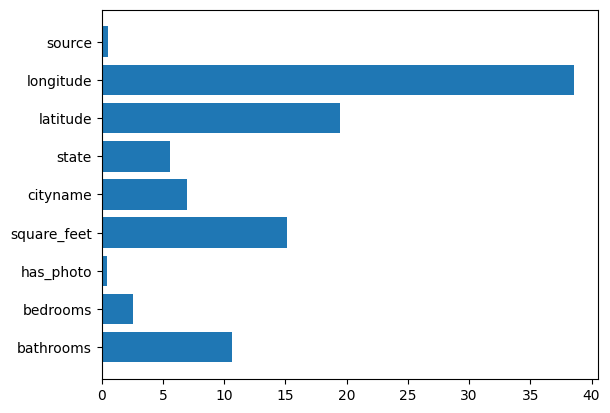

In [187]:
plt.barh(list(df.drop('price',axis=1).columns),list(cat_rg.get_feature_importance()))
plt.show()

In [215]:
#set params
from catboost import CatBoostRegressor

parameters = {
    'iterations': 5000,                
    'learning_rate': 0.025,               
    'depth': 14,                         
    'l2_leaf_reg': 3,                   
    'bagging_temperature': 1.0,         # Controls intensity of Bayesian bagging
    'border_count': 254,                # Number of splits for numerical features         # Indices of categorical features in the input data
    'thread_count': 8,                  # Number of parallel threads used for training
    'random_seed': 42,                  # Seed for random number generator for reproducibility
    'loss_function': 'RMSE',         # Loss function to optimize during training
    'eval_metric': 'RMSE',               # Metric used for evaluation
    'custom_metric': 'RMSE', # Additional metrics to be evaluated during training
    'use_best_model': True,            
    'od_type': 'Iter',                  
    'verbose': True              
}
cat_rg_2 = CatBoostRegressor(**parameters)
cat_rg_2.fit(X_train,y_train,
          eval_set=(X_val,y_val),
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 873.1279909	test: 970.0424466	best: 970.0424466 (0)	total: 67.9ms	remaining: 5m 39s
1:	learn: 861.5789225	test: 959.8574896	best: 959.8574896 (1)	total: 113ms	remaining: 4m 42s
2:	learn: 850.6781498	test: 948.9841528	best: 948.9841528 (2)	total: 162ms	remaining: 4m 29s
3:	learn: 840.2599516	test: 938.9257266	best: 938.9257266 (3)	total: 206ms	remaining: 4m 17s
4:	learn: 829.6107922	test: 929.0979163	best: 929.0979163 (4)	total: 251ms	remaining: 4m 10s
5:	learn: 819.4733493	test: 919.0214384	best: 919.0214384 (5)	total: 294ms	remaining: 4m 4s
6:	learn: 809.5511613	test: 910.0796422	best: 910.0796422 (6)	total: 338ms	remaining: 4m
7:	learn: 800.4879637	test: 901.6558658	best: 901.6558658 (7)	total: 378ms	remaining: 3m 55s
8:	learn: 790.9708455	test: 892.2329083	best: 892.2329083 (8)	total: 425ms	remaining: 3m 55s
9:	learn: 782.4016130	test: 884.5957580	best: 884.5957580 (9)	total: 476ms	remaining: 3m 57s
10:	learn: 773.6459410	test: 876.7408818	best: 876.7408818 (10)	total: 532

88:	learn: 502.4516072	test: 625.9218192	best: 625.9218192 (88)	total: 4.37s	remaining: 4m 1s
89:	learn: 501.2015598	test: 625.1470044	best: 625.1470044 (89)	total: 4.41s	remaining: 4m
90:	learn: 500.1981992	test: 624.4761012	best: 624.4761012 (90)	total: 4.46s	remaining: 4m
91:	learn: 499.1113830	test: 623.8629541	best: 623.8629541 (91)	total: 4.5s	remaining: 4m
92:	learn: 497.8800164	test: 623.3549815	best: 623.3549815 (92)	total: 4.54s	remaining: 3m 59s
93:	learn: 496.6834648	test: 622.6645572	best: 622.6645572 (93)	total: 4.59s	remaining: 3m 59s
94:	learn: 495.3577093	test: 621.6603288	best: 621.6603288 (94)	total: 4.64s	remaining: 3m 59s
95:	learn: 494.2817791	test: 620.7401610	best: 620.7401610 (95)	total: 4.68s	remaining: 3m 59s
96:	learn: 493.0289335	test: 619.9240664	best: 619.9240664 (96)	total: 4.72s	remaining: 3m 58s
97:	learn: 491.8088863	test: 619.0732220	best: 619.0732220 (97)	total: 4.76s	remaining: 3m 58s
98:	learn: 490.7672501	test: 618.6100874	best: 618.6100874 (98)	

174:	learn: 434.4005439	test: 581.2289307	best: 581.2289307 (174)	total: 8.14s	remaining: 3m 44s
175:	learn: 433.9045070	test: 580.9294787	best: 580.9294787 (175)	total: 8.18s	remaining: 3m 44s
176:	learn: 433.4506247	test: 580.5444386	best: 580.5444386 (176)	total: 8.23s	remaining: 3m 44s
177:	learn: 432.7130446	test: 579.8769187	best: 579.8769187 (177)	total: 8.27s	remaining: 3m 43s
178:	learn: 431.9852024	test: 579.1606019	best: 579.1606019 (178)	total: 8.31s	remaining: 3m 43s
179:	learn: 431.5583046	test: 579.0361750	best: 579.0361750 (179)	total: 8.35s	remaining: 3m 43s
180:	learn: 431.1171880	test: 578.6160877	best: 578.6160877 (180)	total: 8.4s	remaining: 3m 43s
181:	learn: 430.7433262	test: 578.5044043	best: 578.5044043 (181)	total: 8.44s	remaining: 3m 43s
182:	learn: 430.3076103	test: 578.4110234	best: 578.4110234 (182)	total: 8.48s	remaining: 3m 43s
183:	learn: 429.9068216	test: 578.1955593	best: 578.1955593 (183)	total: 8.53s	remaining: 3m 43s
184:	learn: 429.4583235	test: 5

262:	learn: 399.1489459	test: 554.4707608	best: 554.4707608 (262)	total: 12.1s	remaining: 3m 38s
263:	learn: 398.9298058	test: 554.2819622	best: 554.2819622 (263)	total: 12.2s	remaining: 3m 38s
264:	learn: 398.5320017	test: 553.9958767	best: 553.9958767 (264)	total: 12.2s	remaining: 3m 38s
265:	learn: 398.1965321	test: 553.6986907	best: 553.6986907 (265)	total: 12.3s	remaining: 3m 38s
266:	learn: 397.8516569	test: 553.5335160	best: 553.5335160 (266)	total: 12.3s	remaining: 3m 37s
267:	learn: 397.5370974	test: 553.2865788	best: 553.2865788 (267)	total: 12.3s	remaining: 3m 37s
268:	learn: 397.3132582	test: 553.0111709	best: 553.0111709 (268)	total: 12.4s	remaining: 3m 37s
269:	learn: 397.0906644	test: 552.9223834	best: 552.9223834 (269)	total: 12.4s	remaining: 3m 37s
270:	learn: 396.8800354	test: 552.7536763	best: 552.7536763 (270)	total: 12.5s	remaining: 3m 37s
271:	learn: 396.6205871	test: 552.5930158	best: 552.5930158 (271)	total: 12.5s	remaining: 3m 37s
272:	learn: 396.2944979	test: 

351:	learn: 377.0565070	test: 540.3150729	best: 540.3150729 (351)	total: 15.8s	remaining: 3m 28s
352:	learn: 376.8978279	test: 540.1934942	best: 540.1934942 (352)	total: 15.8s	remaining: 3m 28s
353:	learn: 376.5778370	test: 540.0409381	best: 540.0409381 (353)	total: 15.9s	remaining: 3m 28s
354:	learn: 376.3217730	test: 539.9037674	best: 539.9037674 (354)	total: 15.9s	remaining: 3m 28s
355:	learn: 376.2036693	test: 539.8274084	best: 539.8274084 (355)	total: 16s	remaining: 3m 28s
356:	learn: 376.0855119	test: 539.7886860	best: 539.7886860 (356)	total: 16s	remaining: 3m 28s
357:	learn: 375.7226992	test: 539.5214858	best: 539.5214858 (357)	total: 16s	remaining: 3m 27s
358:	learn: 375.4359582	test: 539.3626751	best: 539.3626751 (358)	total: 16.1s	remaining: 3m 27s
359:	learn: 375.2062929	test: 539.1720064	best: 539.1720064 (359)	total: 16.1s	remaining: 3m 27s
360:	learn: 375.0267593	test: 539.1948406	best: 539.1720064 (359)	total: 16.2s	remaining: 3m 27s
361:	learn: 374.7762967	test: 539.09

438:	learn: 360.6762377	test: 531.3544222	best: 531.3544222 (438)	total: 19.4s	remaining: 3m 21s
439:	learn: 360.5106824	test: 531.2580076	best: 531.2580076 (439)	total: 19.4s	remaining: 3m 21s
440:	learn: 360.3129684	test: 531.1262366	best: 531.1262366 (440)	total: 19.5s	remaining: 3m 21s
441:	learn: 360.1698131	test: 531.0519723	best: 531.0519723 (441)	total: 19.5s	remaining: 3m 21s
442:	learn: 360.0267532	test: 530.9776532	best: 530.9776532 (442)	total: 19.5s	remaining: 3m 21s
443:	learn: 359.9342882	test: 530.8905867	best: 530.8905867 (443)	total: 19.5s	remaining: 3m 20s
444:	learn: 359.7927941	test: 530.8270766	best: 530.8270766 (444)	total: 19.6s	remaining: 3m 20s
445:	learn: 359.6894412	test: 530.7521883	best: 530.7521883 (445)	total: 19.6s	remaining: 3m 20s
446:	learn: 359.5247034	test: 530.7044135	best: 530.7044135 (446)	total: 19.7s	remaining: 3m 20s
447:	learn: 359.3831093	test: 530.6199706	best: 530.6199706 (447)	total: 19.7s	remaining: 3m 20s
448:	learn: 359.2894205	test: 

525:	learn: 346.8898372	test: 524.6102581	best: 524.6102581 (525)	total: 23s	remaining: 3m 15s
526:	learn: 346.7532663	test: 524.5334530	best: 524.5334530 (526)	total: 23s	remaining: 3m 15s
527:	learn: 346.6309944	test: 524.4604335	best: 524.4604335 (527)	total: 23.1s	remaining: 3m 15s
528:	learn: 346.5046562	test: 524.4224184	best: 524.4224184 (528)	total: 23.1s	remaining: 3m 15s
529:	learn: 346.3722761	test: 524.3883532	best: 524.3883532 (529)	total: 23.1s	remaining: 3m 15s
530:	learn: 346.1390855	test: 524.3291784	best: 524.3291784 (530)	total: 23.2s	remaining: 3m 15s
531:	learn: 346.0290576	test: 524.2752232	best: 524.2752232 (531)	total: 23.2s	remaining: 3m 15s
532:	learn: 345.9337982	test: 524.2386942	best: 524.2386942 (532)	total: 23.3s	remaining: 3m 15s
533:	learn: 345.7627546	test: 524.1834970	best: 524.1834970 (533)	total: 23.3s	remaining: 3m 14s
534:	learn: 345.6827806	test: 524.1477873	best: 524.1477873 (534)	total: 23.4s	remaining: 3m 14s
535:	learn: 345.5452210	test: 524.

610:	learn: 335.5343252	test: 519.1232635	best: 519.1232635 (610)	total: 26.6s	remaining: 3m 10s
611:	learn: 335.3565332	test: 519.0478908	best: 519.0478908 (611)	total: 26.6s	remaining: 3m 10s
612:	learn: 335.2443724	test: 519.0125343	best: 519.0125343 (612)	total: 26.6s	remaining: 3m 10s
613:	learn: 335.1400359	test: 518.9969596	best: 518.9969596 (613)	total: 26.7s	remaining: 3m 10s
614:	learn: 335.0047749	test: 518.9318631	best: 518.9318631 (614)	total: 26.7s	remaining: 3m 10s
615:	learn: 334.8789898	test: 518.9027738	best: 518.9027738 (615)	total: 26.8s	remaining: 3m 10s
616:	learn: 334.7556285	test: 518.8935298	best: 518.8935298 (616)	total: 26.8s	remaining: 3m 10s
617:	learn: 334.6421121	test: 518.8332721	best: 518.8332721 (617)	total: 26.9s	remaining: 3m 10s
618:	learn: 334.4484711	test: 518.6449612	best: 518.6449612 (618)	total: 26.9s	remaining: 3m 10s
619:	learn: 334.3204436	test: 518.5740572	best: 518.5740572 (619)	total: 26.9s	remaining: 3m 10s
620:	learn: 334.1474201	test: 

700:	learn: 324.4840639	test: 514.9549450	best: 514.9549450 (700)	total: 30.4s	remaining: 3m 6s
701:	learn: 324.3619880	test: 514.9055817	best: 514.9055817 (701)	total: 30.4s	remaining: 3m 6s
702:	learn: 324.2606952	test: 514.8808169	best: 514.8808169 (702)	total: 30.5s	remaining: 3m 6s
703:	learn: 324.1353249	test: 514.8394222	best: 514.8394222 (703)	total: 30.5s	remaining: 3m 6s
704:	learn: 324.0092624	test: 514.8120557	best: 514.8120557 (704)	total: 30.6s	remaining: 3m 6s
705:	learn: 323.8922251	test: 514.7664346	best: 514.7664346 (705)	total: 30.6s	remaining: 3m 6s
706:	learn: 323.8082177	test: 514.7376796	best: 514.7376796 (706)	total: 30.6s	remaining: 3m 6s
707:	learn: 323.6800757	test: 514.6810873	best: 514.6810873 (707)	total: 30.7s	remaining: 3m 6s
708:	learn: 323.5208195	test: 514.6050913	best: 514.6050913 (708)	total: 30.7s	remaining: 3m 5s
709:	learn: 323.4019784	test: 514.5702734	best: 514.5702734 (709)	total: 30.8s	remaining: 3m 5s
710:	learn: 323.3040817	test: 514.515840

790:	learn: 314.8072693	test: 511.7419632	best: 511.7419632 (790)	total: 34.2s	remaining: 3m 1s
791:	learn: 314.6803089	test: 511.6822090	best: 511.6822090 (791)	total: 34.2s	remaining: 3m 1s
792:	learn: 314.5905893	test: 511.6541548	best: 511.6541548 (792)	total: 34.2s	remaining: 3m 1s
793:	learn: 314.5088273	test: 511.6709122	best: 511.6541548 (792)	total: 34.3s	remaining: 3m 1s
794:	learn: 314.3870856	test: 511.6426981	best: 511.6426981 (794)	total: 34.3s	remaining: 3m 1s
795:	learn: 314.2844946	test: 511.5657664	best: 511.5657664 (795)	total: 34.4s	remaining: 3m 1s
796:	learn: 314.1930078	test: 511.5532900	best: 511.5532900 (796)	total: 34.4s	remaining: 3m 1s
797:	learn: 314.1016688	test: 511.5016215	best: 511.5016215 (797)	total: 34.5s	remaining: 3m 1s
798:	learn: 313.9691921	test: 511.4137266	best: 511.4137266 (798)	total: 34.5s	remaining: 3m 1s
799:	learn: 313.8905965	test: 511.4201489	best: 511.4137266 (798)	total: 34.5s	remaining: 3m 1s
800:	learn: 313.7988837	test: 511.411821

880:	learn: 306.0054217	test: 509.0576306	best: 509.0454942 (879)	total: 37.9s	remaining: 2m 57s
881:	learn: 305.9219168	test: 509.0307863	best: 509.0307863 (881)	total: 38s	remaining: 2m 57s
882:	learn: 305.8309093	test: 509.0286670	best: 509.0286670 (882)	total: 38s	remaining: 2m 57s
883:	learn: 305.7409826	test: 509.0116180	best: 509.0116180 (883)	total: 38.1s	remaining: 2m 57s
884:	learn: 305.6611759	test: 508.9720784	best: 508.9720784 (884)	total: 38.1s	remaining: 2m 57s
885:	learn: 305.5847213	test: 508.9549020	best: 508.9549020 (885)	total: 38.1s	remaining: 2m 57s
886:	learn: 305.5087314	test: 508.9447554	best: 508.9447554 (886)	total: 38.2s	remaining: 2m 57s
887:	learn: 305.4450760	test: 508.9321686	best: 508.9321686 (887)	total: 38.2s	remaining: 2m 56s
888:	learn: 305.3723032	test: 508.8915927	best: 508.8915927 (888)	total: 38.3s	remaining: 2m 56s
889:	learn: 305.3004219	test: 508.9180982	best: 508.8915927 (888)	total: 38.3s	remaining: 2m 56s
890:	learn: 305.2323161	test: 508.

965:	learn: 299.0731086	test: 507.1543252	best: 507.1543252 (965)	total: 41.5s	remaining: 2m 53s
966:	learn: 299.0016899	test: 507.1155945	best: 507.1155945 (966)	total: 41.5s	remaining: 2m 53s
967:	learn: 298.9296489	test: 507.0874921	best: 507.0874921 (967)	total: 41.6s	remaining: 2m 53s
968:	learn: 298.8506115	test: 507.0408238	best: 507.0408238 (968)	total: 41.6s	remaining: 2m 53s
969:	learn: 298.7552631	test: 507.0128408	best: 507.0128408 (969)	total: 41.7s	remaining: 2m 53s
970:	learn: 298.6740414	test: 506.9840756	best: 506.9840756 (970)	total: 41.7s	remaining: 2m 53s
971:	learn: 298.5925819	test: 507.0020803	best: 506.9840756 (970)	total: 41.8s	remaining: 2m 53s
972:	learn: 298.5171380	test: 506.9748447	best: 506.9748447 (972)	total: 41.8s	remaining: 2m 52s
973:	learn: 298.4437927	test: 506.9446208	best: 506.9446208 (973)	total: 41.8s	remaining: 2m 52s
974:	learn: 298.3834695	test: 506.9101770	best: 506.9101770 (974)	total: 41.9s	remaining: 2m 52s
975:	learn: 298.2849845	test: 

1049:	learn: 292.7229497	test: 505.6513352	best: 505.6513352 (1049)	total: 45.1s	remaining: 2m 49s
1050:	learn: 292.6657007	test: 505.6588710	best: 505.6513352 (1049)	total: 45.1s	remaining: 2m 49s
1051:	learn: 292.6019254	test: 505.6117779	best: 505.6117779 (1051)	total: 45.2s	remaining: 2m 49s
1052:	learn: 292.5174091	test: 505.5763563	best: 505.5763563 (1052)	total: 45.2s	remaining: 2m 49s
1053:	learn: 292.4296431	test: 505.5436785	best: 505.5436785 (1053)	total: 45.2s	remaining: 2m 49s
1054:	learn: 292.3477098	test: 505.5273830	best: 505.5273830 (1054)	total: 45.3s	remaining: 2m 49s
1055:	learn: 292.2326141	test: 505.5254951	best: 505.5254951 (1055)	total: 45.3s	remaining: 2m 49s
1056:	learn: 292.1833231	test: 505.4919428	best: 505.4919428 (1056)	total: 45.4s	remaining: 2m 49s
1057:	learn: 292.1397831	test: 505.5112708	best: 505.4919428 (1056)	total: 45.4s	remaining: 2m 49s
1058:	learn: 292.0373363	test: 505.4918622	best: 505.4918622 (1058)	total: 45.5s	remaining: 2m 49s
1059:	lear

1134:	learn: 286.7135453	test: 504.0384890	best: 504.0384890 (1134)	total: 48.7s	remaining: 2m 45s
1135:	learn: 286.6486030	test: 504.0229486	best: 504.0229486 (1135)	total: 48.7s	remaining: 2m 45s
1136:	learn: 286.5711473	test: 504.0008861	best: 504.0008861 (1136)	total: 48.8s	remaining: 2m 45s
1137:	learn: 286.5095788	test: 503.9924113	best: 503.9924113 (1137)	total: 48.8s	remaining: 2m 45s
1138:	learn: 286.4452295	test: 503.9633343	best: 503.9633343 (1138)	total: 48.8s	remaining: 2m 45s
1139:	learn: 286.3972125	test: 503.9545995	best: 503.9545995 (1139)	total: 48.9s	remaining: 2m 45s
1140:	learn: 286.3085076	test: 503.9290331	best: 503.9290331 (1140)	total: 48.9s	remaining: 2m 45s
1141:	learn: 286.2331485	test: 503.9053974	best: 503.9053974 (1141)	total: 49s	remaining: 2m 45s
1142:	learn: 286.1658000	test: 503.9013227	best: 503.9013227 (1142)	total: 49s	remaining: 2m 45s
1143:	learn: 286.1253345	test: 503.8957583	best: 503.8957583 (1143)	total: 49s	remaining: 2m 45s
1144:	learn: 286

1219:	learn: 281.1154745	test: 502.5073973	best: 502.5073973 (1219)	total: 52.2s	remaining: 2m 41s
1220:	learn: 281.0462346	test: 502.4694625	best: 502.4694625 (1220)	total: 52.3s	remaining: 2m 41s
1221:	learn: 280.9397370	test: 502.4124119	best: 502.4124119 (1221)	total: 52.3s	remaining: 2m 41s
1222:	learn: 280.8911378	test: 502.3851259	best: 502.3851259 (1222)	total: 52.4s	remaining: 2m 41s
1223:	learn: 280.8283242	test: 502.4062431	best: 502.3851259 (1222)	total: 52.4s	remaining: 2m 41s
1224:	learn: 280.7301125	test: 502.4372575	best: 502.3851259 (1222)	total: 52.4s	remaining: 2m 41s
1225:	learn: 280.6556662	test: 502.4173884	best: 502.3851259 (1222)	total: 52.5s	remaining: 2m 41s
1226:	learn: 280.6108218	test: 502.4118472	best: 502.3851259 (1222)	total: 52.5s	remaining: 2m 41s
1227:	learn: 280.5415476	test: 502.3948493	best: 502.3851259 (1222)	total: 52.6s	remaining: 2m 41s
1228:	learn: 280.4871140	test: 502.3951967	best: 502.3851259 (1222)	total: 52.6s	remaining: 2m 41s
1229:	lear

1304:	learn: 275.7707335	test: 501.3759127	best: 501.3759127 (1304)	total: 55.8s	remaining: 2m 37s
1305:	learn: 275.6703430	test: 501.3444782	best: 501.3444782 (1305)	total: 55.8s	remaining: 2m 37s
1306:	learn: 275.6346537	test: 501.3474121	best: 501.3444782 (1305)	total: 55.9s	remaining: 2m 37s
1307:	learn: 275.5813244	test: 501.3326099	best: 501.3326099 (1307)	total: 55.9s	remaining: 2m 37s
1308:	learn: 275.5227381	test: 501.3243733	best: 501.3243733 (1308)	total: 56s	remaining: 2m 37s
1309:	learn: 275.4583809	test: 501.2880365	best: 501.2880365 (1309)	total: 56s	remaining: 2m 37s
1310:	learn: 275.3958999	test: 501.2739519	best: 501.2739519 (1310)	total: 56s	remaining: 2m 37s
1311:	learn: 275.3641574	test: 501.2509022	best: 501.2509022 (1311)	total: 56.1s	remaining: 2m 37s
1312:	learn: 275.3135146	test: 501.2731597	best: 501.2509022 (1311)	total: 56.1s	remaining: 2m 37s
1313:	learn: 275.2632429	test: 501.2613440	best: 501.2509022 (1311)	total: 56.2s	remaining: 2m 37s
1314:	learn: 275

1389:	learn: 270.9727183	test: 500.4762230	best: 500.4706935 (1386)	total: 59.4s	remaining: 2m 34s
1390:	learn: 270.9248042	test: 500.4912469	best: 500.4706935 (1386)	total: 59.4s	remaining: 2m 34s
1391:	learn: 270.8604999	test: 500.4772212	best: 500.4706935 (1386)	total: 59.4s	remaining: 2m 34s
1392:	learn: 270.8153137	test: 500.4808724	best: 500.4706935 (1386)	total: 59.5s	remaining: 2m 34s
1393:	learn: 270.7786336	test: 500.4810607	best: 500.4706935 (1386)	total: 59.5s	remaining: 2m 33s
1394:	learn: 270.7205246	test: 500.4629660	best: 500.4629660 (1394)	total: 59.6s	remaining: 2m 33s
1395:	learn: 270.6773163	test: 500.4567060	best: 500.4567060 (1395)	total: 59.6s	remaining: 2m 33s
1396:	learn: 270.6169107	test: 500.4534499	best: 500.4534499 (1396)	total: 59.6s	remaining: 2m 33s
1397:	learn: 270.5588722	test: 500.4334787	best: 500.4334787 (1397)	total: 59.7s	remaining: 2m 33s
1398:	learn: 270.5025907	test: 500.4354483	best: 500.4334787 (1397)	total: 59.7s	remaining: 2m 33s
1399:	lear

1474:	learn: 266.5986454	test: 499.7505110	best: 499.7505110 (1474)	total: 1m 2s	remaining: 2m 30s
1475:	learn: 266.5489677	test: 499.7462700	best: 499.7462700 (1475)	total: 1m 2s	remaining: 2m 30s
1476:	learn: 266.4783281	test: 499.7248851	best: 499.7248851 (1476)	total: 1m 3s	remaining: 2m 30s
1477:	learn: 266.4314364	test: 499.7191918	best: 499.7191918 (1477)	total: 1m 3s	remaining: 2m 30s
1478:	learn: 266.3945175	test: 499.7122900	best: 499.7122900 (1478)	total: 1m 3s	remaining: 2m 30s
1479:	learn: 266.3304189	test: 499.7181670	best: 499.7122900 (1478)	total: 1m 3s	remaining: 2m 30s
1480:	learn: 266.2859127	test: 499.7167751	best: 499.7122900 (1478)	total: 1m 3s	remaining: 2m 30s
1481:	learn: 266.2491525	test: 499.7193197	best: 499.7122900 (1478)	total: 1m 3s	remaining: 2m 30s
1482:	learn: 266.2264050	test: 499.7062400	best: 499.7062400 (1482)	total: 1m 3s	remaining: 2m 30s
1483:	learn: 266.1921514	test: 499.6886174	best: 499.6886174 (1483)	total: 1m 3s	remaining: 2m 29s
1484:	lear

1559:	learn: 262.4430079	test: 499.0455676	best: 499.0455676 (1559)	total: 1m 6s	remaining: 2m 26s
1560:	learn: 262.3946302	test: 499.0401705	best: 499.0401705 (1560)	total: 1m 6s	remaining: 2m 26s
1561:	learn: 262.3403453	test: 499.0097024	best: 499.0097024 (1561)	total: 1m 6s	remaining: 2m 26s
1562:	learn: 262.2836348	test: 498.9718469	best: 498.9718469 (1562)	total: 1m 6s	remaining: 2m 26s
1563:	learn: 262.2412832	test: 498.9535792	best: 498.9535792 (1563)	total: 1m 6s	remaining: 2m 26s
1564:	learn: 262.2083321	test: 498.9531766	best: 498.9531766 (1564)	total: 1m 6s	remaining: 2m 26s
1565:	learn: 262.1642000	test: 498.9386594	best: 498.9386594 (1565)	total: 1m 6s	remaining: 2m 26s
1566:	learn: 262.1135323	test: 498.9356476	best: 498.9356476 (1566)	total: 1m 6s	remaining: 2m 26s
1567:	learn: 262.0682889	test: 498.9325063	best: 498.9325063 (1567)	total: 1m 6s	remaining: 2m 26s
1568:	learn: 262.0238838	test: 498.9287843	best: 498.9287843 (1568)	total: 1m 6s	remaining: 2m 26s
1569:	lear

1644:	learn: 258.6492241	test: 498.2457443	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1645:	learn: 258.5995445	test: 498.2490882	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1646:	learn: 258.5504001	test: 498.2667498	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1647:	learn: 258.5147235	test: 498.2603648	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1648:	learn: 258.4920157	test: 498.2608310	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1649:	learn: 258.4171660	test: 498.2584801	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1650:	learn: 258.3739523	test: 498.2475306	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1651:	learn: 258.3368981	test: 498.2439703	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1652:	learn: 258.2968969	test: 498.2399132	best: 498.2394620 (1643)	total: 1m 10s	remaining: 2m 22s
1653:	learn: 258.2635498	test: 498.2341008	best: 498.2341008 (1653)	total: 1m 10s	remaining: 2m 22s


1729:	learn: 255.0707171	test: 497.6099023	best: 497.6099023 (1729)	total: 1m 13s	remaining: 2m 19s
1730:	learn: 254.9895747	test: 497.6088172	best: 497.6088172 (1730)	total: 1m 13s	remaining: 2m 19s
1731:	learn: 254.9577698	test: 497.6102104	best: 497.6088172 (1730)	total: 1m 13s	remaining: 2m 19s
1732:	learn: 254.9180650	test: 497.5868702	best: 497.5868702 (1732)	total: 1m 13s	remaining: 2m 19s
1733:	learn: 254.8838469	test: 497.5791268	best: 497.5791268 (1733)	total: 1m 13s	remaining: 2m 19s
1734:	learn: 254.8566596	test: 497.5814086	best: 497.5791268 (1733)	total: 1m 13s	remaining: 2m 18s
1735:	learn: 254.8077095	test: 497.5795398	best: 497.5791268 (1733)	total: 1m 13s	remaining: 2m 18s
1736:	learn: 254.7764956	test: 497.5581179	best: 497.5581179 (1736)	total: 1m 13s	remaining: 2m 18s
1737:	learn: 254.7351578	test: 497.5487091	best: 497.5487091 (1737)	total: 1m 13s	remaining: 2m 18s
1738:	learn: 254.6986562	test: 497.5455238	best: 497.5455238 (1738)	total: 1m 14s	remaining: 2m 18s


1814:	learn: 251.7000055	test: 496.9088305	best: 496.9088305 (1814)	total: 1m 17s	remaining: 2m 15s
1815:	learn: 251.6672546	test: 496.8994603	best: 496.8994603 (1815)	total: 1m 17s	remaining: 2m 15s
1816:	learn: 251.6316666	test: 496.8905825	best: 496.8905825 (1816)	total: 1m 17s	remaining: 2m 15s
1817:	learn: 251.6081822	test: 496.8890392	best: 496.8890392 (1817)	total: 1m 17s	remaining: 2m 15s
1818:	learn: 251.5767717	test: 496.8881112	best: 496.8881112 (1818)	total: 1m 17s	remaining: 2m 15s
1819:	learn: 251.5460814	test: 496.8916330	best: 496.8881112 (1818)	total: 1m 17s	remaining: 2m 15s
1820:	learn: 251.5081582	test: 496.8738560	best: 496.8738560 (1820)	total: 1m 17s	remaining: 2m 15s
1821:	learn: 251.4749821	test: 496.8738472	best: 496.8738472 (1821)	total: 1m 17s	remaining: 2m 15s
1822:	learn: 251.4443517	test: 496.8666976	best: 496.8666976 (1822)	total: 1m 17s	remaining: 2m 15s
1823:	learn: 251.4058497	test: 496.8450230	best: 496.8450230 (1823)	total: 1m 17s	remaining: 2m 15s


1899:	learn: 248.3059761	test: 496.3617207	best: 496.3617207 (1899)	total: 1m 20s	remaining: 2m 11s
1900:	learn: 248.2609819	test: 496.3598015	best: 496.3598015 (1900)	total: 1m 20s	remaining: 2m 11s
1901:	learn: 248.2308372	test: 496.3585438	best: 496.3585438 (1901)	total: 1m 20s	remaining: 2m 11s
1902:	learn: 248.1995260	test: 496.3615064	best: 496.3585438 (1901)	total: 1m 20s	remaining: 2m 11s
1903:	learn: 248.1493404	test: 496.3639678	best: 496.3585438 (1901)	total: 1m 21s	remaining: 2m 11s
1904:	learn: 248.1219657	test: 496.3643501	best: 496.3585438 (1901)	total: 1m 21s	remaining: 2m 11s
1905:	learn: 248.0942140	test: 496.3496871	best: 496.3496871 (1905)	total: 1m 21s	remaining: 2m 11s
1906:	learn: 248.0524898	test: 496.3265344	best: 496.3265344 (1906)	total: 1m 21s	remaining: 2m 11s
1907:	learn: 248.0173949	test: 496.3300415	best: 496.3265344 (1906)	total: 1m 21s	remaining: 2m 11s
1908:	learn: 247.9776935	test: 496.3172518	best: 496.3172518 (1908)	total: 1m 21s	remaining: 2m 11s


1983:	learn: 245.3166018	test: 495.8524526	best: 495.8524526 (1983)	total: 1m 24s	remaining: 2m 8s
1984:	learn: 245.2592003	test: 495.8394942	best: 495.8394942 (1984)	total: 1m 24s	remaining: 2m 8s
1985:	learn: 245.2177132	test: 495.8240711	best: 495.8240711 (1985)	total: 1m 24s	remaining: 2m 8s
1986:	learn: 245.1958683	test: 495.8184564	best: 495.8184564 (1986)	total: 1m 24s	remaining: 2m 8s
1987:	learn: 245.1669887	test: 495.8206762	best: 495.8184564 (1986)	total: 1m 24s	remaining: 2m 8s
1988:	learn: 245.1408236	test: 495.8219542	best: 495.8184564 (1986)	total: 1m 24s	remaining: 2m 8s
1989:	learn: 245.0944859	test: 495.7892336	best: 495.7892336 (1989)	total: 1m 24s	remaining: 2m 8s
1990:	learn: 245.0578371	test: 495.7929221	best: 495.7892336 (1989)	total: 1m 25s	remaining: 2m 8s
1991:	learn: 245.0143394	test: 495.7798588	best: 495.7798588 (1991)	total: 1m 25s	remaining: 2m 8s
1992:	learn: 244.9802327	test: 495.7770934	best: 495.7770934 (1992)	total: 1m 25s	remaining: 2m 8s
1993:	lear

2066:	learn: 242.3240188	test: 495.5151700	best: 495.4993901 (2056)	total: 1m 28s	remaining: 2m 5s
2067:	learn: 242.2974620	test: 495.5017145	best: 495.4993901 (2056)	total: 1m 28s	remaining: 2m 5s
2068:	learn: 242.2617922	test: 495.4887048	best: 495.4887048 (2068)	total: 1m 28s	remaining: 2m 5s
2069:	learn: 242.2317786	test: 495.4875650	best: 495.4875650 (2069)	total: 1m 28s	remaining: 2m 5s
2070:	learn: 242.2105052	test: 495.4815282	best: 495.4815282 (2070)	total: 1m 28s	remaining: 2m 5s
2071:	learn: 242.1702992	test: 495.4736143	best: 495.4736143 (2071)	total: 1m 28s	remaining: 2m 5s
2072:	learn: 242.1115594	test: 495.4446472	best: 495.4446472 (2072)	total: 1m 28s	remaining: 2m 5s
2073:	learn: 242.0803670	test: 495.4367977	best: 495.4367977 (2073)	total: 1m 28s	remaining: 2m 5s
2074:	learn: 242.0414304	test: 495.4318396	best: 495.4318396 (2074)	total: 1m 28s	remaining: 2m 4s
2075:	learn: 241.9990356	test: 495.4269227	best: 495.4269227 (2075)	total: 1m 28s	remaining: 2m 4s
2076:	lear

2150:	learn: 239.5397934	test: 495.0403974	best: 495.0352436 (2149)	total: 1m 31s	remaining: 2m 1s
2151:	learn: 239.5096719	test: 495.0385008	best: 495.0352436 (2149)	total: 1m 31s	remaining: 2m 1s
2152:	learn: 239.4774273	test: 495.0363331	best: 495.0352436 (2149)	total: 1m 31s	remaining: 2m 1s
2153:	learn: 239.4554241	test: 495.0284008	best: 495.0284008 (2153)	total: 1m 32s	remaining: 2m 1s
2154:	learn: 239.4207356	test: 495.0146971	best: 495.0146971 (2154)	total: 1m 32s	remaining: 2m 1s
2155:	learn: 239.3838528	test: 494.9806644	best: 494.9806644 (2155)	total: 1m 32s	remaining: 2m 1s
2156:	learn: 239.3338913	test: 494.9785878	best: 494.9785878 (2156)	total: 1m 32s	remaining: 2m 1s
2157:	learn: 239.3003812	test: 494.9708452	best: 494.9708452 (2157)	total: 1m 32s	remaining: 2m 1s
2158:	learn: 239.2219638	test: 494.9609011	best: 494.9609011 (2158)	total: 1m 32s	remaining: 2m 1s
2159:	learn: 239.1961987	test: 494.9658452	best: 494.9609011 (2158)	total: 1m 32s	remaining: 2m 1s
2160:	lear

2235:	learn: 236.5229259	test: 494.7765482	best: 494.7511868 (2223)	total: 1m 35s	remaining: 1m 58s
2236:	learn: 236.4770432	test: 494.7695042	best: 494.7511868 (2223)	total: 1m 35s	remaining: 1m 57s
2237:	learn: 236.4440330	test: 494.7599592	best: 494.7511868 (2223)	total: 1m 35s	remaining: 1m 57s
2238:	learn: 236.4080911	test: 494.7473260	best: 494.7473260 (2238)	total: 1m 35s	remaining: 1m 57s
2239:	learn: 236.3666720	test: 494.7397722	best: 494.7397722 (2239)	total: 1m 35s	remaining: 1m 57s
2240:	learn: 236.3482014	test: 494.7529700	best: 494.7397722 (2239)	total: 1m 35s	remaining: 1m 57s
2241:	learn: 236.3008989	test: 494.7491078	best: 494.7397722 (2239)	total: 1m 35s	remaining: 1m 57s
2242:	learn: 236.2653753	test: 494.7494630	best: 494.7397722 (2239)	total: 1m 35s	remaining: 1m 57s
2243:	learn: 236.2314275	test: 494.7442859	best: 494.7397722 (2239)	total: 1m 35s	remaining: 1m 57s
2244:	learn: 236.1821967	test: 494.7352000	best: 494.7352000 (2244)	total: 1m 35s	remaining: 1m 57s


2321:	learn: 233.9090457	test: 494.3742090	best: 494.3661694 (2316)	total: 1m 39s	remaining: 1m 54s
2322:	learn: 233.8761725	test: 494.3626311	best: 494.3626311 (2322)	total: 1m 39s	remaining: 1m 54s
2323:	learn: 233.8596296	test: 494.3559412	best: 494.3559412 (2323)	total: 1m 39s	remaining: 1m 54s
2324:	learn: 233.8395887	test: 494.3603185	best: 494.3559412 (2323)	total: 1m 39s	remaining: 1m 54s
2325:	learn: 233.8129525	test: 494.3552999	best: 494.3552999 (2325)	total: 1m 39s	remaining: 1m 54s
2326:	learn: 233.7804046	test: 494.3501386	best: 494.3501386 (2326)	total: 1m 39s	remaining: 1m 54s
2327:	learn: 233.7495147	test: 494.3471181	best: 494.3471181 (2327)	total: 1m 39s	remaining: 1m 53s
2328:	learn: 233.6940416	test: 494.3389562	best: 494.3389562 (2328)	total: 1m 39s	remaining: 1m 53s
2329:	learn: 233.6704508	test: 494.3335049	best: 494.3335049 (2329)	total: 1m 39s	remaining: 1m 53s
2330:	learn: 233.6422302	test: 494.3247459	best: 494.3247459 (2330)	total: 1m 39s	remaining: 1m 53s


2406:	learn: 231.3192835	test: 493.9347185	best: 493.9347185 (2406)	total: 1m 42s	remaining: 1m 50s
2407:	learn: 231.2831382	test: 493.9258776	best: 493.9258776 (2407)	total: 1m 42s	remaining: 1m 50s
2408:	learn: 231.2572988	test: 493.9252563	best: 493.9252563 (2408)	total: 1m 42s	remaining: 1m 50s
2409:	learn: 231.2285876	test: 493.9333308	best: 493.9252563 (2408)	total: 1m 42s	remaining: 1m 50s
2410:	learn: 231.2028743	test: 493.9288646	best: 493.9252563 (2408)	total: 1m 42s	remaining: 1m 50s
2411:	learn: 231.1674938	test: 493.9222703	best: 493.9222703 (2411)	total: 1m 42s	remaining: 1m 50s
2412:	learn: 231.1260614	test: 493.9179573	best: 493.9179573 (2412)	total: 1m 42s	remaining: 1m 50s
2413:	learn: 231.1001523	test: 493.9217023	best: 493.9179573 (2412)	total: 1m 42s	remaining: 1m 50s
2414:	learn: 231.0684527	test: 493.9256801	best: 493.9179573 (2412)	total: 1m 42s	remaining: 1m 50s
2415:	learn: 231.0410848	test: 493.9278548	best: 493.9179573 (2412)	total: 1m 43s	remaining: 1m 50s


2491:	learn: 228.8993995	test: 493.6798552	best: 493.6798552 (2491)	total: 1m 46s	remaining: 1m 46s
2492:	learn: 228.8740559	test: 493.6681542	best: 493.6681542 (2492)	total: 1m 46s	remaining: 1m 46s
2493:	learn: 228.8485144	test: 493.6673770	best: 493.6673770 (2493)	total: 1m 46s	remaining: 1m 46s
2494:	learn: 228.8164705	test: 493.6538201	best: 493.6538201 (2494)	total: 1m 46s	remaining: 1m 46s
2495:	learn: 228.7884418	test: 493.6424879	best: 493.6424879 (2495)	total: 1m 46s	remaining: 1m 46s
2496:	learn: 228.7559245	test: 493.6350515	best: 493.6350515 (2496)	total: 1m 46s	remaining: 1m 46s
2497:	learn: 228.7200506	test: 493.6235781	best: 493.6235781 (2497)	total: 1m 46s	remaining: 1m 46s
2498:	learn: 228.6873858	test: 493.6150049	best: 493.6150049 (2498)	total: 1m 46s	remaining: 1m 46s
2499:	learn: 228.6719522	test: 493.6132685	best: 493.6132685 (2499)	total: 1m 46s	remaining: 1m 46s
2500:	learn: 228.6460968	test: 493.6100858	best: 493.6100858 (2500)	total: 1m 46s	remaining: 1m 46s


2576:	learn: 226.5547473	test: 493.3167369	best: 493.3080930 (2574)	total: 1m 49s	remaining: 1m 43s
2577:	learn: 226.5322543	test: 493.3028493	best: 493.3028493 (2577)	total: 1m 49s	remaining: 1m 43s
2578:	learn: 226.5048843	test: 493.2977452	best: 493.2977452 (2578)	total: 1m 49s	remaining: 1m 43s
2579:	learn: 226.4893292	test: 493.2898678	best: 493.2898678 (2579)	total: 1m 49s	remaining: 1m 43s
2580:	learn: 226.4649020	test: 493.2877015	best: 493.2877015 (2580)	total: 1m 49s	remaining: 1m 43s
2581:	learn: 226.4332878	test: 493.2827637	best: 493.2827637 (2581)	total: 1m 50s	remaining: 1m 43s
2582:	learn: 226.4060969	test: 493.2775260	best: 493.2775260 (2582)	total: 1m 50s	remaining: 1m 42s
2583:	learn: 226.3728525	test: 493.2719669	best: 493.2719669 (2583)	total: 1m 50s	remaining: 1m 42s
2584:	learn: 226.3431161	test: 493.2903713	best: 493.2719669 (2583)	total: 1m 50s	remaining: 1m 42s
2585:	learn: 226.3277951	test: 493.2875153	best: 493.2719669 (2583)	total: 1m 50s	remaining: 1m 42s


2661:	learn: 224.2922478	test: 493.0102641	best: 492.9914858 (2648)	total: 1m 53s	remaining: 1m 39s
2662:	learn: 224.2646189	test: 492.9947040	best: 492.9914858 (2648)	total: 1m 53s	remaining: 1m 39s
2663:	learn: 224.2391526	test: 492.9916093	best: 492.9914858 (2648)	total: 1m 53s	remaining: 1m 39s
2664:	learn: 224.2135399	test: 492.9888477	best: 492.9888477 (2664)	total: 1m 53s	remaining: 1m 39s
2665:	learn: 224.1984139	test: 492.9954612	best: 492.9888477 (2664)	total: 1m 53s	remaining: 1m 39s
2666:	learn: 224.1783520	test: 492.9877887	best: 492.9877887 (2666)	total: 1m 53s	remaining: 1m 39s
2667:	learn: 224.1629345	test: 492.9891762	best: 492.9877887 (2666)	total: 1m 53s	remaining: 1m 39s
2668:	learn: 224.1399805	test: 492.9846006	best: 492.9846006 (2668)	total: 1m 53s	remaining: 1m 39s
2669:	learn: 224.1149016	test: 492.9830042	best: 492.9830042 (2669)	total: 1m 53s	remaining: 1m 39s
2670:	learn: 224.0975829	test: 492.9794177	best: 492.9794177 (2670)	total: 1m 53s	remaining: 1m 39s


In [216]:
pred_cat_2 = cat_rg_2.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_cat_2)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_cat_2))}")
print(f"R2 Score : {r2_score(y_test,pred_cat_2)}")

mean absolute error : 205.14511310916942
root mean squared error : 441.94473389959944
R2 Score : 0.7419133597037424


In [217]:
from xgboost import XGBRFRegressor

In [233]:
params_xgb = {
    "tree_method": "auto",
    "n_estimators": 2000,
    "learning_rate": 0.05,
    "max_depth": 20,
    "min_child_weight": 3,
    "subsample": 1.0,
    "colsample_bytree": 1.0,
    "gamma": 2,
    "reg_lambda": 1,
    "eval_metric": "rmse",
    "random_state": 0,
}
from xgboost import XGBRegressor,XGBRFRegressor
xg_reg = XGBRegressor(**params_xgb,objective='reg:squarederror')
xg_reg.fit(X_train,y_train)
pred_xgb = xg_reg.predict(X_test)


In [234]:
print(f"mean absolute error : {mean_absolute_error(y_test,pred_xgb)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_xgb))}")
print(f"R2 Score : {r2_score(y_test,pred_xgb)}")
metrics_dict["XGB"] = [mean_absolute_error(y_test,pred_xgb),np.sqrt(mean_squared_error(y_test,pred_xgb))]

mean absolute error : 189.91459692423538
root mean squared error : 446.67060188243823
R2 Score : 0.736364228582086


In [224]:
metrics_df = pd.DataFrame(metrics_dict,index=['MAE','RMSE'])

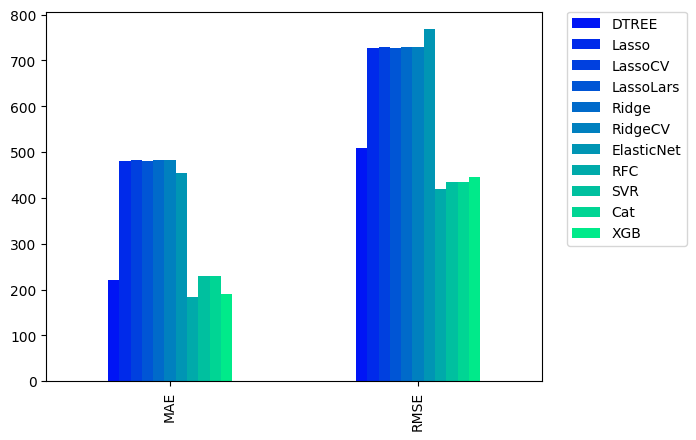

In [225]:
#dtree gives best results so far
colors = sns.color_palette("winter", len(metrics_df.columns))
metrics_df.plot(kind='bar', color=colors)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [254]:
from lightgbm import LGBMRegressor
params = {
    'learning_rate': 0.001,          # Increase learning rate to a more typical value
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmse',
    'sub_feature': 0.7,             # Feature fraction for better generalization
    'num_leaves': 600,               # Further reduce the number of leaves
    'min_child_samples': 13,        # Increase min child samples for better generalization
    'n_estimators': 6000,            # Reduce number of estimators
    'max_depth': 600,                # Set max depth to a reasonable value
    'bagging_fraction': 0.75,       # Reduce bagging fraction to introduce more randomness
    'bagging_freq': 5,              # Bagging every 5 iterations
    'lambda_l1': 0.2,               # Add L1 regularization
    'lambda_l2': 0.2                # Add L2 regularization
}
lgbm_rg = LGBMRegressor(**params)
lgbm_rg.fit(X_train,y_train,eval_set=(X_val,y_val))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=

LGBMRegressor(bagging_fraction=0.75, bagging_freq=5, lambda_l1=0.2,
              lambda_l2=0.2, learning_rate=0.001, max_depth=600, metric='rmse',
              min_child_samples=13, n_estimators=6000, num_leaves=600,
              objective='regression', sub_feature=0.7)

In [255]:
pred_lg = lgbm_rg.predict(X_test)
print(f"mean absolute error : {mean_absolute_error(y_test,pred_lg)}")
print(f"root mean squared error : {np.sqrt(mean_squared_error(y_test,pred_lg))}")
print(f"R2 Score : {r2_score(y_test,pred_lg)}")
metrics_dict["LGBM"] = [mean_absolute_error(y_test,pred_lg),np.sqrt(mean_squared_error(y_test,pred_lg))]

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.7. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
mean absolute error : 200.0174455022673
root mean squared error : 372.30833419301945
R2 Score : 0.7924755597596458
